In [ ]:
!pip install folium
!pip install rtree

In [ ]:
!pip3 uninstall rtree
!sudo apt install libspatialindex-dev
!pip3 install rtree

In [9]:
!ls locations/1916

arbeiter_zeitung.geojson	     le_matin.geojson
helsingin_sanomat.geojson	     l_oeuvre.geojson
illustrierte_kronen_zeitung.geojson  neue_freie_presse.geojson
innsbrucker_nachrichten.geojson      uusi_suometar.geojson


In [10]:
import geopandas as gpd

year = 1916
paper = 'neue_freie_presse'

geometry = gpd.read_file(f'locations/{year}/{paper}.geojson')

geometry

,mention,address,freq,geometry
0,Wien,"Wien, Österreich",46322.0,POINT (16.37250 48.20835)
1,Berlin,"Berlin, 10117, Deutschland",9197.0,POINT (13.38886 52.51704)
2,Deutschland,Deutschland,8863.0,POINT (10.42345 51.08342)
3,Budapest,"Budapest, V. kerület, Közép-Magyarország, Magy...",6392.0,POINT (19.04047 47.49838)
4,Oesterreich,Österreich,6342.0,POINT (13.20000 47.20000)
...,...,...,...,...
30955,Hotel Kummer,"Kummer, Schmölln, Altenburger Land, Thüringen,...",2.0,POINT (12.37553 50.87537)
30956,"Wien , UnterMeidling , Schallergasse 3",None,2.0,None
30957,Kriegsgef .,None,2.0,None
30958,"B . , Neustiftgasse Nr",None,2.0,None


In [21]:
import geopandas as gpd
# import rtree
gpd.options.use_pygeos = False

shape_1914 = gpd.read_file('shapefiles/cntry1914.shp')
shape_1914.set_index('NAME', inplace=True)
shape_1914.set_crs(epsg=4326, inplace=True)

,AREA,ABBREVNAME,FIPS_CODE,WB_CNTRY,geometry
NAME,,,,,
Luxembourg,1041.095,Luxembourg,LU,LUX,"POLYGON ((6.02716 49.52408, 6.08806 49.68051, ..."
Switzerland,16004.784,Switzerland,SZ,CHE,"POLYGON ((9.70079 47.57741, 9.78801 47.42603, ..."
Cyprus,3544.955,Cyprus,CY,CYP,"POLYGON ((33.98416 35.22511, 33.97633 35.14626..."
Bhutan,14789.163,Bhutan,BT,BTN,"POLYGON ((89.00624 27.19796, 89.56920 27.89310..."
Qatar,3901.375,Qatar,QA,QAT,"POLYGON ((51.49149 24.42775, 51.32341 24.41563..."
...,...,...,...,...,...
Arabia (Nejd),17.845,Arabia,None,None,"MULTIPOLYGON (((53.22461 16.67074, 53.09799 16..."
Arabia (Nejd),20.717,Arabia,None,None,"POLYGON ((52.56026 16.25092, 52.44131 16.11723..."
Mongolia,0.000,Mongolia,None,None,"POLYGON ((116.96344 49.94687, 116.83071 49.807..."


/home/vagrant/.local/lib/python3.6/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


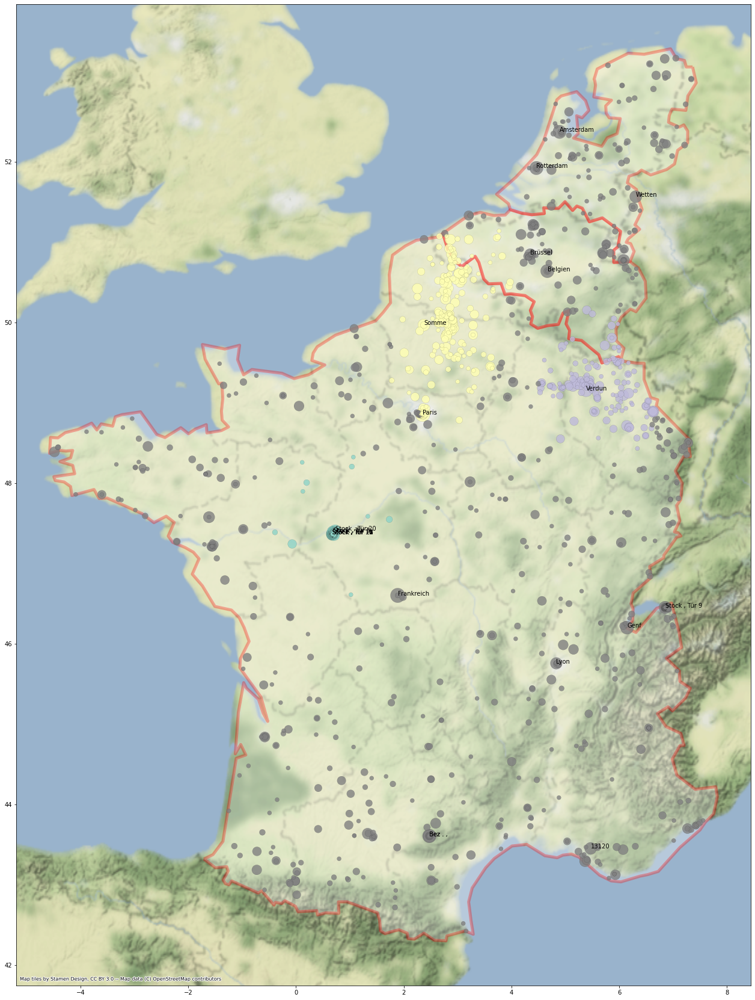

In [22]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import contextily as cx

import hdbscan
import pandas as pd

from shapely.ops import cascaded_union

from sklearn.cluster import OPTICS
from shapely.geometry import Polygon

import numpy as np

import rtree


def plot_events(countries, levels=10, th=.3, min_freq=1, clustering=0, remove_outliers=0, kde=0, draw_map=0, add_pn_annot=0, debug=0, fronts=None):
    palette = sns.color_palette('Set3')
    
    fig, ax = plt.subplots(figsize=(30,30))
    # ax.set_xlim(-10, 35)
    # ax.set_ylim(35, 80)

    global geometry
    
    geometry.set_crs(epsg=4326, inplace=True)
    
    if countries:
        shape_1914.loc[countries].plot(ax=ax, color='white', alpha=.3, edgecolor='red', linewidth=5)
        inpoly = geometry.within(cascaded_union(shape_1914.loc[countries].geometry))
        goodpoints = geometry[inpoly]
    
    for front in fronts:
        gpd.GeoDataFrame([1], geometry=[front], crs=shape_1914.crs).plot(ax=ax, alpha=.5)
    
    if draw_map:
        cx.add_basemap(ax=ax, crs=shape_1914.crs.to_string(), source=cx.providers.Stamen.TerrainBackground)  # cx.providers.OpenTopoMap, cx.providers.Stamen.TerrainBackground
    
    vectors = pd.concat((goodpoints.geometry.x, goodpoints.geometry.y), axis=1)
    vectors = pd.DataFrame(vectors)
    vectors.rename(columns = {0: 'x', 1: 'y'}, inplace = True)
    
    colors = palette[3]
    
    if clustering:
        # clusterer = KMeans(n_clusters=6)
        # clusterer = DBSCAN(eps=.275, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=-1)
        # clusterer = OPTICS(min_samples=5, max_eps=5, metric='minkowski', p=2, metric_params=None, cluster_method='xi', eps=None, xi=0.5,
        #                   predecessor_correction=True, min_cluster_size=None, algorithm='auto', leaf_size=30, n_jobs=-1)
        
        clusterer = hdbscan.HDBSCAN(min_cluster_size=80, metric='euclidean',
                                    cluster_selection_epsilon=.5,
                                    gen_min_span_tree=True)
        
        clusterer.fit(vectors)
        goodpoints['cluster'] = clusterer.labels_
    
        colors = [palette[col % len(palette)] if col >= 0 else (0.5, 0.5, 0.5) for col in clusterer.labels_]
        
        if debug:
            for i, p in enumerate(vectors.itertuples()):
                # print(p.Index)
                ax.annotate(clusterer.labels_[i], (p.x, p.y))
    
    goodpoints = goodpoints[goodpoints.freq > min_freq]
    
    if add_pn_annot:
        for p in goodpoints[goodpoints.freq > 200].itertuples():
            ax.annotate(p.mention, (p.geometry.x, p.geometry.y))
    
    log_freqs = np.log2(goodpoints.freq)   # np.log2(goodpoints.freq)*10
    log_freqs *= 50
    
    goodpoints.plot(ax=ax, color=colors, markersize=log_freqs, alpha=.8, edgecolor='black', linewidth=.1)
    
    # sns.histplot(data=vectors, x='x', y='y', ax=ax, fill=True, bins=7)
    
    if kde:
        sns.kdeplot(data=vectors, x='x', y='y',
                    levels=levels, thresh=th, weights=log_freqs,
                    color=palette[2], fill=True, cmap="mako", alpha=.6, ax=ax)
            
    return goodpoints, clusterer

european = ['Finland', 'German Empire', 'Luxembourg', 'Belgium', 'United Kingdom', 'Ireland', 'Netherlands', 'Austro-Hungarian Empire', 'Russia', 'Sweden', 'Norway', 'Romania',
                'Bulgaria', 'France', 'Italy', 'Switzerland', 'Greece', 'Albania', 'Serbia', 'Montenegro', 'Turkish Empire', 'Spain', 'Denmark', 'Portugal',
               'Spanish Morocco', 'Morocco', 'Algeria', 'Tunisia', 'Libya', 'Egypt']

events, clusterer = plot_events(countries=['France', 'Belgium', 'Netherlands'], levels=5, th=.4, min_freq=1, clustering=1, kde=0, draw_map=1, add_pn_annot=1, debug=0, fronts=[]) #[western_front, eastern_front, italian_front])

In [23]:
events[events.within(shape_1914.loc['Belgium'].geometry)]

,mention,address,freq,geometry,cluster
51,Belgien,België / Belgique / Belgien,1036.0,POINT (4.66671 50.64028),-1
261,Brüssel,"Ville de Bruxelles - Stad Brussel, Brussel-Hoo...",223.0,POINT (4.35170 50.84656),-1
647,Ypern,"Ieper, West-Vlaanderen, Vlaanderen, België / B...",86.0,POINT (2.89147 50.85170),1
722,Dixmude,"Diksmuide, West-Vlaanderen, Vlaanderen, 8600, ...",78.0,POINT (2.86472 51.03334),1
752,Maas,"Maas, Borgharen, Maastricht, Limburg, Nederlan...",74.0,POINT (5.69664 50.86933),-1
...,...,...,...,...,...
29116,Kommer,"Kommer, Mariagrube, Huppenbroich, Simmerath, S...",2.0,POINT (6.31236 50.59592),-1
29584,Anr,"Internationale Luchthaven Antwerpen, Zoomweg, ...",2.0,POINT (4.46347 51.18814),-1
30404,Elektrizitätswerk,"Elektrizitätswerk, Monschau, Städteregion Aach...",2.0,POINT (6.24697 50.55375),-1
30425,1 . zirk,"1, Zirkstraat, Schipperskwartier, Antwerpen, V...",2.0,POINT (4.40001 51.22323),-1


In [24]:
events[events.within(western_front)]

,mention,address,freq,geometry,cluster
51,Belgien,België / Belgique / Belgien,1036.0,POINT (4.66671 50.64028),-1
69,Verdun,"Verdun, Meuse, Grand Est, France métropolitain...",779.0,POINT (5.38673 49.15893),2
197,Somme,"Somme, Hauts-de-France, France métropolitaine,...",275.0,POINT (2.37386 49.96897),1
261,Brüssel,"Ville de Bruxelles - Stad Brussel, Brussel-Hoo...",223.0,POINT (4.35170 50.84656),-1
647,Ypern,"Ieper, West-Vlaanderen, Vlaanderen, België / B...",86.0,POINT (2.89147 50.85170),1
...,...,...,...,...,...
30750,Spincourt,"Spincourt, Verdun, Meuse, Grand Est, France mé...",2.0,POINT (5.66702 49.32886),2
30766,51037,"Châlons-en-Champagne, Marne, Grand Est, France...",2.0,POINT (4.35903 48.95376),-1
30813,Vionville,"Vionville, Rezonville-Vionville, Metz, Moselle...",2.0,POINT (5.94806 49.09230),2
30821,59154,"Crespin, Valenciennes, Nord, Hauts-de-France, ...",2.0,POINT (3.65954 50.42007),1


<AxesSubplot:>

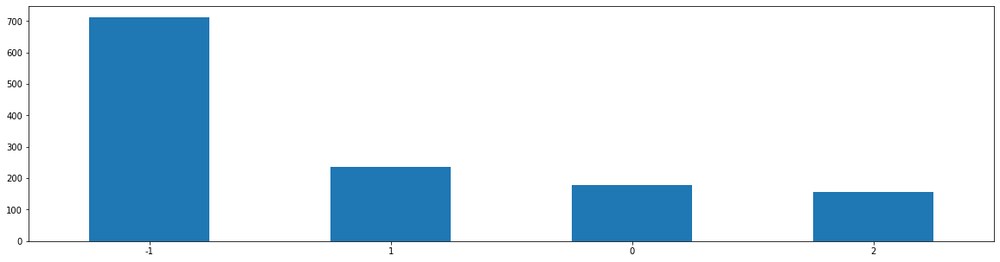

In [25]:
events.cluster.value_counts().plot.bar(figsize=(20, 5), rot=0)

In [26]:
events[events.cluster == 1]

,mention,address,freq,geometry,cluster
12,Paris,"Paris, Île-de-France, France métropolitaine, F...",3590.0,POINT (2.35146 48.85670),1
197,Somme,"Somme, Hauts-de-France, France métropolitaine,...",275.0,POINT (2.37386 49.96897),1
647,Ypern,"Ieper, West-Vlaanderen, Vlaanderen, België / B...",86.0,POINT (2.89147 50.85170),1
722,Dixmude,"Diksmuide, West-Vlaanderen, Vlaanderen, 8600, ...",78.0,POINT (2.86472 51.03334),1
824,La Bassée,"La Bassée, Lille, Nord, Hauts-de-France, Franc...",68.0,POINT (2.80466 50.53163),1
...,...,...,...,...,...
28737,Andechy,"Andechy, Montdidier, Somme, Hauts-de-France, F...",2.0,POINT (2.70903 49.71490),1
29445,Varennes,"Varennes, Péronne, Somme, Hauts-de-France, Fra...",2.0,POINT (2.53471 50.04913),1
29654,Puisieux,"Puisieux, Arras, Pas-de-Calais, Hauts-de-Franc...",2.0,POINT (2.69390 50.11670),1
30061,Hazebrouck,"Hazebrouck, Dunkerque, Nord, Hauts-de-France, ...",2.0,POINT (2.53603 50.72261),1


In [27]:
import pandas as pd

ents = pd.read_json(f'entities/{year}/{paper}.json')

spatial_context = ents.merge(events[events.within(western_front)])
spatial_context

,id,link,type,mention,start_idx,end_idx,stance,date,address,freq,geometry,cluster
0,entity_mention_neue_freie_presse_nfp19160101_49,https://www.wikidata.org/wiki/Q473419,LOC,Hulluch,204,211,0,1916-01-01,"Hulluch, Lens, Pas-de-Calais, Hauts-de-France,...",23.0,POINT (2.81342 50.48685),1
1,entity_mention_neue_freie_presse_nfp19160209_361,https://www.wikidata.org/wiki/Q473419,LOC,Hulluch,166,173,0,1916-02-09,"Hulluch, Lens, Pas-de-Calais, Hauts-de-France,...",23.0,POINT (2.81342 50.48685),1
2,entity_mention_neue_freie_presse_nfp19160213_277,https://www.wikidata.org/wiki/Q473419,LOC,Hulluch,597,604,0,1916-02-13,"Hulluch, Lens, Pas-de-Calais, Hauts-de-France,...",23.0,POINT (2.81342 50.48685),1
3,entity_mention_neue_freie_presse_nfp19160225_2815,https://www.wikidata.org/wiki/Q473419,LOC,Hulluch,69,76,0,1916-02-25,"Hulluch, Lens, Pas-de-Calais, Hauts-de-France,...",23.0,POINT (2.81342 50.48685),1
4,entity_mention_neue_freie_presse_nfp19160307_181,None,LOC,Hulluch,0,7,0,1916-03-07,"Hulluch, Lens, Pas-de-Calais, Hauts-de-France,...",23.0,POINT (2.81342 50.48685),1
...,...,...,...,...,...,...,...,...,...,...,...,...
6066,entity_mention_neue_freie_presse_nfp19161215_494,None,LOC,Le Four de Paris,90,106,0,1916-12-15,"Le Four de Paris, Vienne-le-Château, Châlons-e...",2.0,POINT (4.93861 49.18628),2
6067,entity_mention_neue_freie_presse_nfp19161215_2591,None,LOC,"97—26 ,",52,58,0,1916-12-15,"97, Allée de la Bergerie, Sainghin-en-Mélantoi...",2.0,POINT (3.16132 50.58934),1
6068,entity_mention_neue_freie_presse_nfp19161231_6348,None,LOC,"97—26 ,",77,83,0,1916-12-31,"97, Allée de la Bergerie, Sainghin-en-Mélantoi...",2.0,POINT (3.16132 50.58934),1
6069,entity_mention_neue_freie_presse_nfp19161221_2727,None,LOC,Pension „ Arenbergpark “,0,22,0,1916-12-21,"LAVAN, 62, Celestijnenlaan, Heverlee, Leuven, ...",2.0,POINT (4.67740 50.86849),-1


In [28]:
from os.path import join
import json

from tqdm.notebook import tqdm

DATADIR = f'data/export_hackathon/{year}/{paper}'

window =300

contexts = []


with tqdm(total=spatial_context.shape[0], desc='Extracting place name contexts') as p_bar:
    for mention_ref in spatial_context.id.tolist():
        fname = mention_ref.split('entity_mention_')[1]
        base, i = fname.rsplit('_', 1)

        with open(join(DATADIR, f'{base}.json')) as src_file:
            data = json.load(src_file)
            item = data['issue']['named_entities'][int(i)]

            left = ' '.join(data['issue']['full_text'][item['start_idx']-window:item['start_idx']].split('\n'))
            target = data['issue']['full_text'][item['start_idx']:item['end_idx']]
            right = ' '.join(data['issue']['full_text'][item['end_idx']+1:item['end_idx']+window].split('\n'))

            # print(left, '\033[42m ' + target + ' \033[0m', right)

            contexts.append(f'{left} {target} {right}')
        p_bar.update(1)
        
with open(f'subcorpora/{year}/{paper}_westernfront', 'w') as subcorpus:
    [subcorpus.write(f'{ctx}\n') for ctx in contexts]

Extracting place name contexts:   0%|          | 0/6071 [00:00<?, ?it/s]

In [29]:
from random import sample

for ctx in sample(contexts, 10):
    print(ctx[:window], '\033[42m', ctx[window:-window], '\033[0m', ctx[-window:])

 des anderthalbjährigen Positionskrieges, der sich dort abspielt, während welchem die beiderseitigen Linien: sich gegenseitig aneinander abgeschliffen haben, eine erhebliche Anzahl von Punkten eine ganz spezielle und erhöhte Bedeutung erlangt. Als einer dieser Punkte an der Nordfront wäre zu nächst    Ypern   — das taktische Rätsel von Flandern — zu erwähnen, das die Verbündeten noch immer als Brückenkopf ihrer Kanalstellungen mit äußerster Anstreugung und zähester Tapferkeit festzuhalten trachten, trotzdem die Stadt schon längst in einen Trümmerhaufen zusammengeschossen wurde, und trotzdem die Deutsche
r, daß diese blutigen Angriffe am 26. vergeblich geblieben waren, hatten sich die Deutschen an diesem Tage von Nord und Ost näher an die Festung herangeschoben und überdies noch das Fort Hardaumont — östlich von Douaumont — in ihren Besitz benommen. Angriffsversuche der Engländer am 25. östlich von    Armentieres   und am 26. südöstlich von Ypern waren gleichfalls resultatlos geblieben.

# Referencing with Wikidata

In [ ]:
!pip install sparqlwrapper

In [17]:
from SPARQLWrapper import SPARQLWrapper, JSON

sparql = SPARQLWrapper("https://query.wikidata.org/sparql")

sparql.setQuery("""
    SELECT ?item ?itemLabel ?itemDescription
    WHERE
    {
        ?item wdt:P31 wd:Q718893 .
        ?item wdt:P361 wd:Q361 .
        SERVICE wikibase:label { bd:serviceParam wikibase:language "en" }
    }
    """)

sparql.setReturnFormat(JSON)
results = sparql.query().convert()

for theatre in results['results']['bindings']:
    print(theatre['itemLabel']['value'], theatre['item']['value'])

African theatre of World War I http://www.wikidata.org/entity/Q659991
naval warfare of World War I http://www.wikidata.org/entity/Q695497
Asian and Pacific theatre of World War I http://www.wikidata.org/entity/Q1047682
Middle Eastern theatre of World War I http://www.wikidata.org/entity/Q1765465
European theatre of World War I http://www.wikidata.org/entity/Q2410539


## European theatre of the war

In [15]:
from SPARQLWrapper import SPARQLWrapper, JSON

sparql = SPARQLWrapper("https://query.wikidata.org/sparql")

def get_parts(concept):
    sparql.setQuery("""
        SELECT ?item ?itemLabel ?itemDescription
        WHERE
        {
            ?item wdt:P361 wd:%s .
            SERVICE wikibase:label { bd:serviceParam wikibase:language "en" }
        }
        """ % concept)

    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

results = get_parts('Q2410539')

for front in results['results']['bindings']:
    print(front['itemLabel']['value'], front['item']['value'])

Western Front of World War I http://www.wikidata.org/entity/Q152989
Eastern Front http://www.wikidata.org/entity/Q154573
Italian Front http://www.wikidata.org/entity/Q659745
Balkans Campaign http://www.wikidata.org/entity/Q789406


### The Western Front

In [16]:
from SPARQLWrapper import SPARQLWrapper, JSON

sparql = SPARQLWrapper("https://query.wikidata.org/sparql")

def get_locs(front):
    sparql.setQuery("""
        SELECT ?item ?itemLabel ?location
        WHERE
        {
            ?item wdt:P361 wd:%s .
            OPTIONAL {?item wdt:P625 ?location .}
            SERVICE wikibase:label { bd:serviceParam wikibase:language "en" }
        }
        """ % front)
    
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

results = get_locs('Q152989')

/home/vagrant/.local/lib/python3.6/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


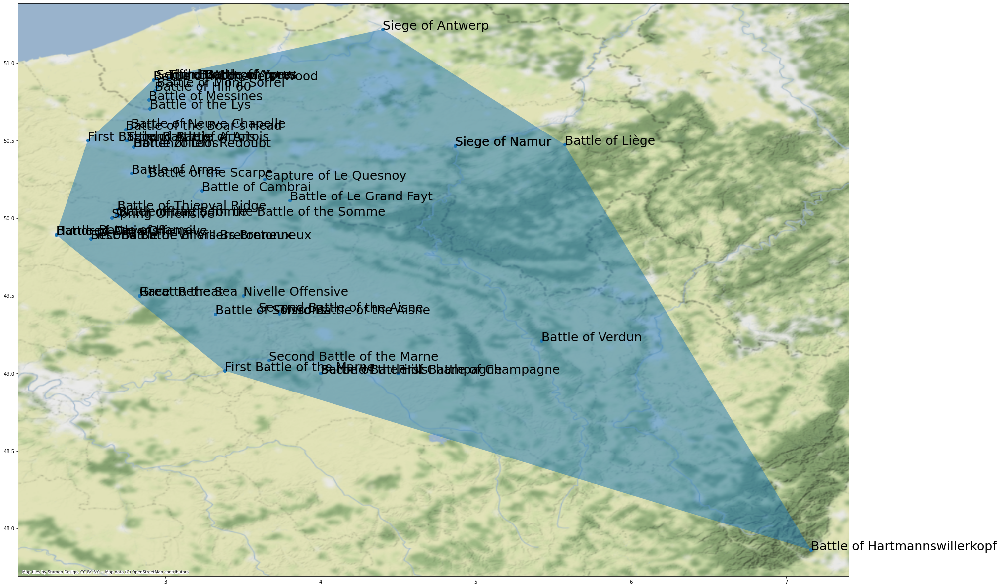

In [17]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely import wkt

import contextily as cx

gpd.options.use_pygeos = True

def plot_battles(results, countries=[], figsize=(30, 30), convex=True, tile=True):
    battles = gpd.GeoDataFrame(columns=['name', 'description', 'geometry'])

    for item in results['results']['bindings']:
        if 'location' in item:
            battles = battles.append({'name': item['itemLabel']['value'], 'geometry': wkt.loads(item['location']['value'])}, ignore_index=1)
            continue
        battles = battles.append({'name': item['itemLabel']['value']}, ignore_index=1)

    fig, ax = plt.subplots(figsize=figsize)    

    if countries:
        shape_1914.loc[countries].plot(ax=ax, color='white', alpha=.3, edgecolor='red', linewidth=5)

    polygon = battles.unary_union.convex_hull if convex else battles.unary_union.envelope
    gpd.GeoDataFrame([1], geometry=[polygon]).plot(ax=ax, alpha=.5)
    if tile: cx.add_basemap(ax=ax, crs=shape_1914.crs.to_string(), source=cx.providers.Stamen.TerrainBackground)  # cx.providers.OpenTopoMap, cx.providers.Stamen.TerrainBackground
    battles.plot(ax=ax)

    for battle in battles[battles.geometry.notna()].itertuples():
        ax.annotate(battle.name, (battle.geometry.x, battle.geometry.y), fontsize=25)
       
    return polygon
    

western_front = plot_battles(results)

### The Eastern Front

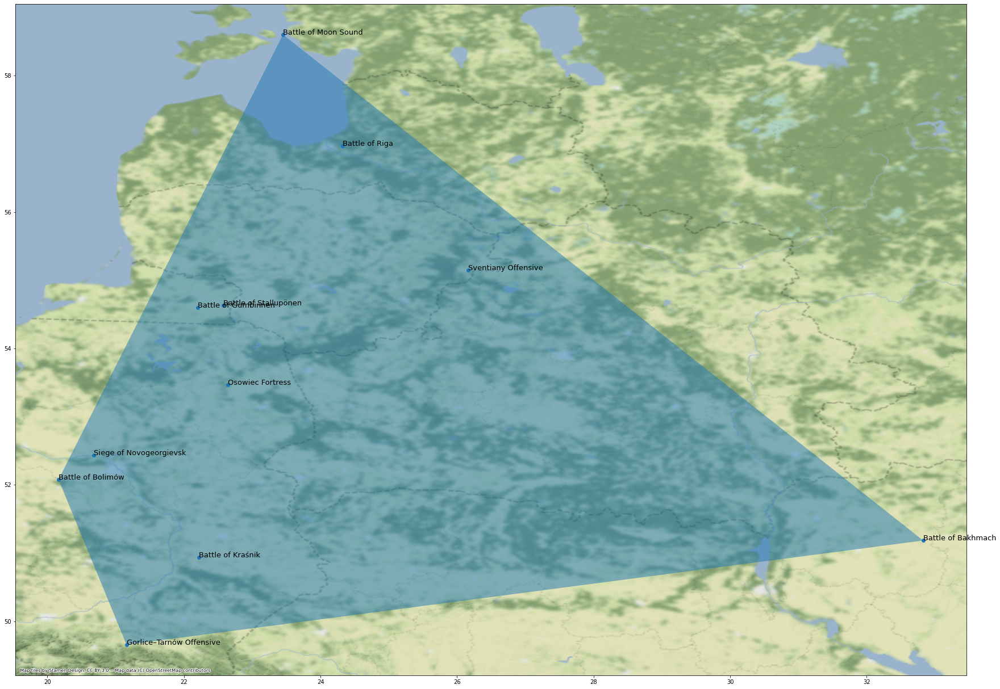

In [67]:
results = get_locs('Q154573')
eastern_front = plot_battles(results, [])

### Italian Front

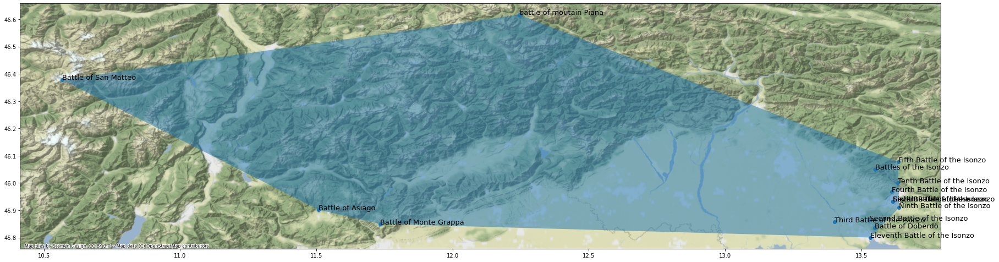

In [75]:
results = get_locs('Q659745')
italian_front = plot_battles(results)

## Middle Eastern theatre of WWI

In [11]:
sparql.setQuery("""
    SELECT ?item ?itemLabel ?itemDescription
    WHERE
    {
        ?item wdt:P361 wd:Q1765465 .
        SERVICE wikibase:label { bd:serviceParam wikibase:language "en" }
    }
    """)

sparql.setReturnFormat(JSON)
results = sparql.query().convert()

for campaign in results['results']['bindings']:
    print(campaign['itemLabel']['value'], campaign['item']['value'])

Mesopotamian campaign http://www.wikidata.org/entity/Q18937
Gallipoli campaign http://www.wikidata.org/entity/Q164983
Arab Revolt http://www.wikidata.org/entity/Q239060
Persian Campaign http://www.wikidata.org/entity/Q372822
Second Battle of Gaza http://www.wikidata.org/entity/Q388581
Caucasus campaign http://www.wikidata.org/entity/Q523154
Sinai and Palestine campaign http://www.wikidata.org/entity/Q727536
Third Battle of Gaza http://www.wikidata.org/entity/Q941322
South Arabia during World War I http://www.wikidata.org/entity/Q2333111
Battle of Romani http://www.wikidata.org/entity/Q2722527
First Battle of Gaza http://www.wikidata.org/entity/Q2791318
Battle of Katia http://www.wikidata.org/entity/Q3866914
Battle of Aleppo http://www.wikidata.org/entity/Q4870258
Battle of Arara http://www.wikidata.org/entity/Q4870323
Battle of Ayun Kara http://www.wikidata.org/entity/Q4870372
Battle of El Buggar Ridge http://www.wikidata.org/entity/Q4870951
Battle of Haifa http://www.wikidata.org/enti

### Gallipolli campaign

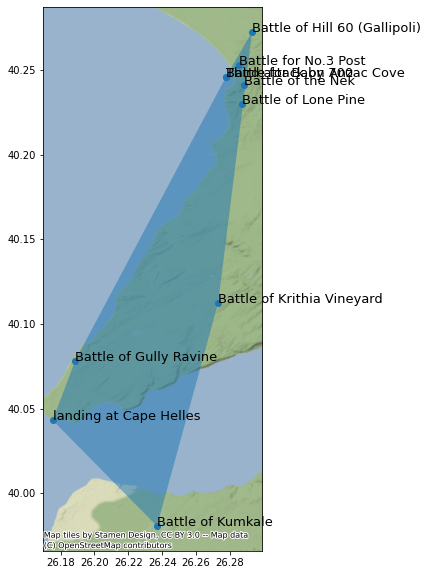

In [15]:
results = get_locs('Q164983')

plot_battles(results, figsize=(20, 10))

### Mesopotamian campaign

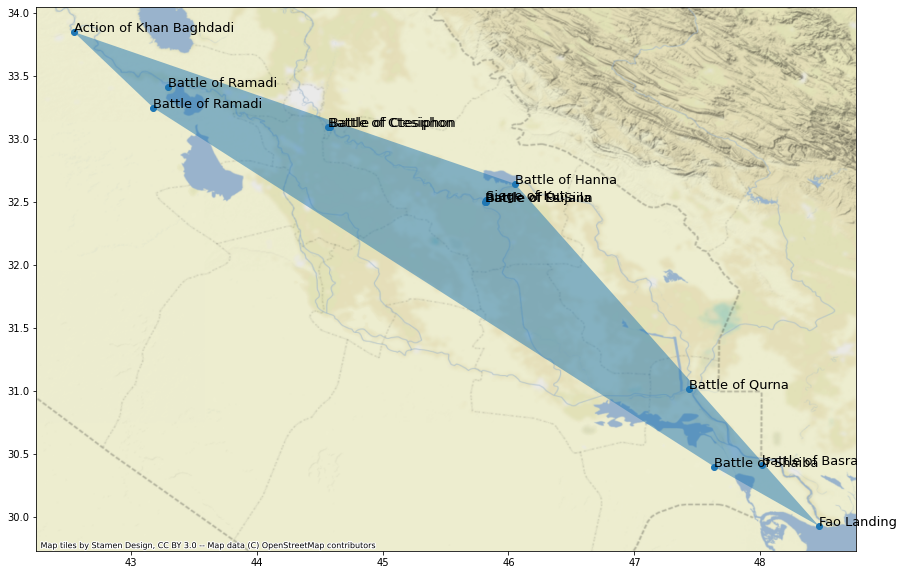

In [16]:
results = get_locs('Q18937')

plot_battles(results, countries=[], figsize=(20, 10))

### Caucasus campaign

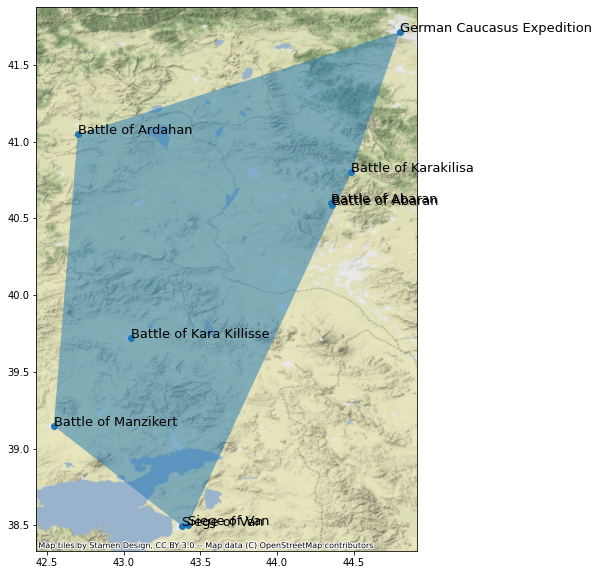

In [17]:
results = get_locs('Q523154')
plot_battles(results, figsize=(30, 10))

### Sinai and Palestine campaign

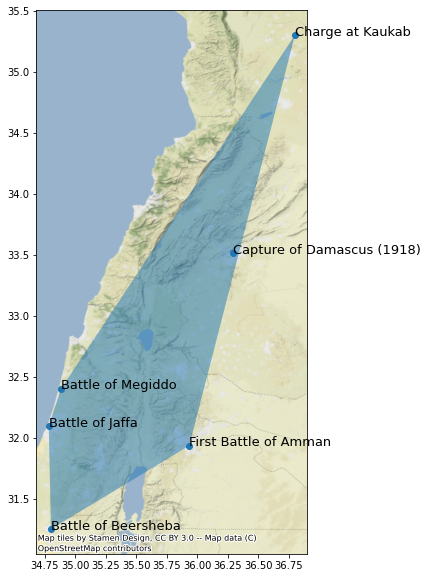

In [18]:
results = get_locs('Q727536')
plot_battles(results, figsize=(10, 10))

## African theatre of WWI

In [187]:
results = get_locs('Q659991')

for campaign in results['results']['bindings']:
    print(campaign['itemLabel']['value'], campaign['item']['value'])

Togoland Campaign http://www.wikidata.org/entity/Q512700
South-West Africa Campaign http://www.wikidata.org/entity/Q704886
East African Campaign http://www.wikidata.org/entity/Q705571
North African operations during World War I http://www.wikidata.org/entity/Q941428
Kamerun campaign http://www.wikidata.org/entity/Q5042244


### South-West Africa Campaign

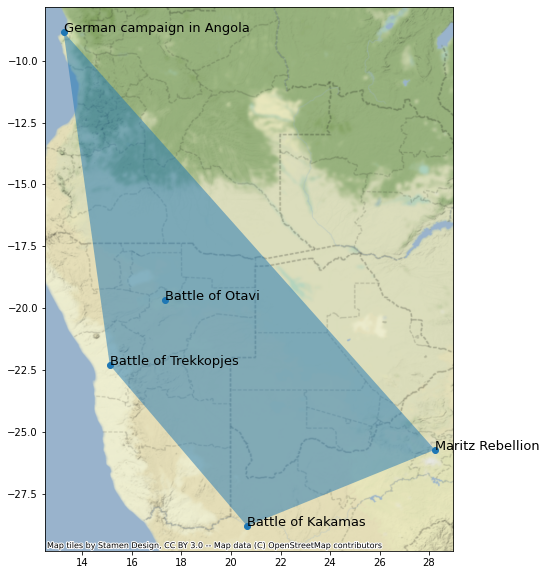

In [190]:
results = get_locs('Q704886')
plot_battles(results, figsize=(10, 10), tile=True)

### Kamerun campaign

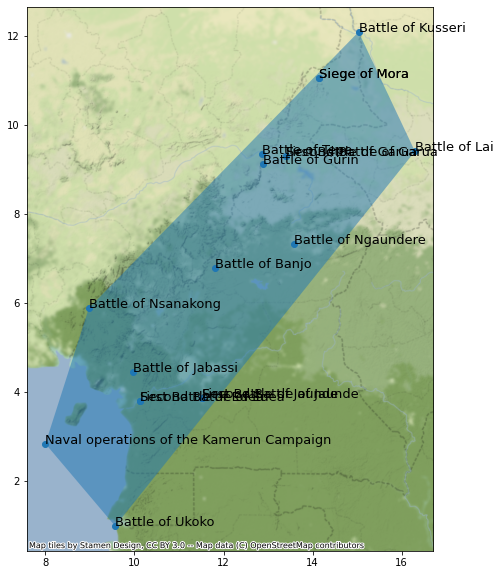

In [19]:
results = get_locs('Q5042244')
plot_battles(results, figsize=(10, 10))

## Asian and Pacific theatre of World War I

In [196]:
results = get_locs('Q1047682')

for front in results['results']['bindings']:
    print(front['itemLabel']['value'], front['item']['value'])

Siege of Tsingtao http://www.wikidata.org/entity/Q706563
Occupation of German Samoa http://www.wikidata.org/entity/Q2081983
Battle of Bita Paka http://www.wikidata.org/entity/Q4741179
Siege of Toma http://www.wikidata.org/entity/Q4745032
Siege of Toma http://www.wikidata.org/entity/Q4745032
Australian occupation of German New Guinea http://www.wikidata.org/entity/Q4825066
Scuttling of SMS Cormoran http://www.wikidata.org/entity/Q7439615


## Naval warfare of World War I

In [198]:
results = get_locs('Q695497')

for warfare in results['results']['bindings']:
    print(warfare['itemLabel']['value'], warfare['item']['value'])

naval warfare in the Mediterranean during World War I http://www.wikidata.org/entity/Q899191
U-boat Campain from 1914 to 1918 http://www.wikidata.org/entity/Q2316150
Adriatic Campaign of World War I http://www.wikidata.org/entity/Q3884054
Atlantic U-boat Campaign of World War I http://www.wikidata.org/entity/Q4809533
Q15128131 http://www.wikidata.org/entity/Q15128131


### Mediterranean

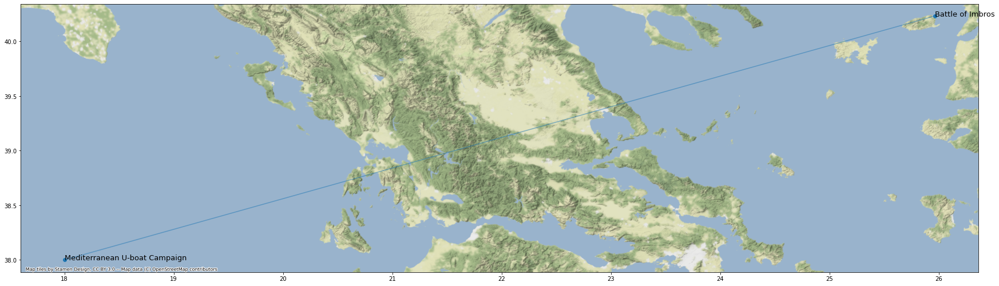

In [200]:
results = get_locs('Q899191')
plot_battles(results)

### Adriatic campaign

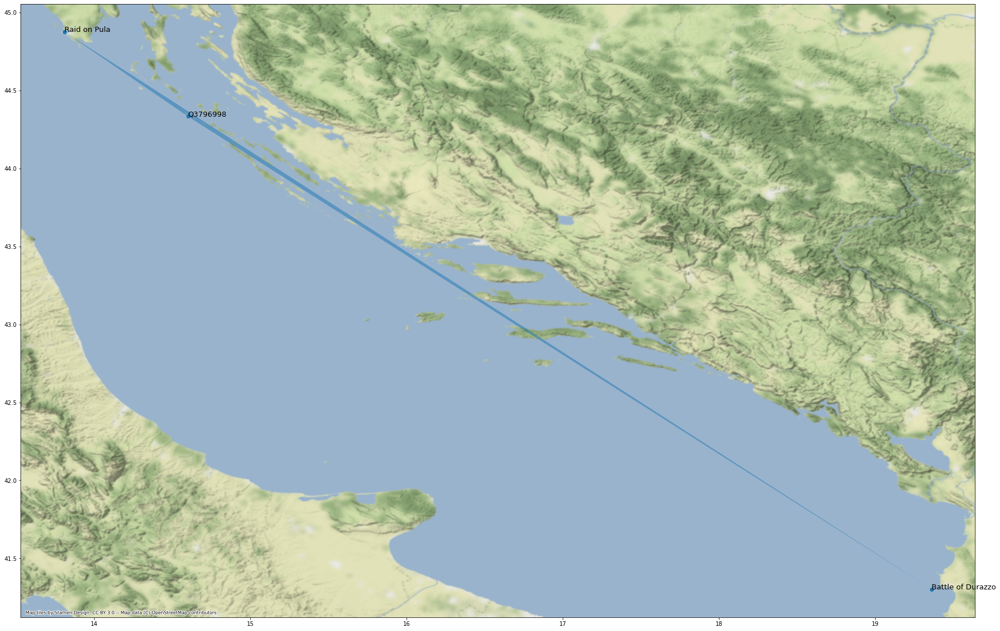

In [206]:
results = get_locs('Q3884054')
plot_battles(results)

In [ ]:
battles.to_file('WWI_battles.geojson', driver='GeoJSON')